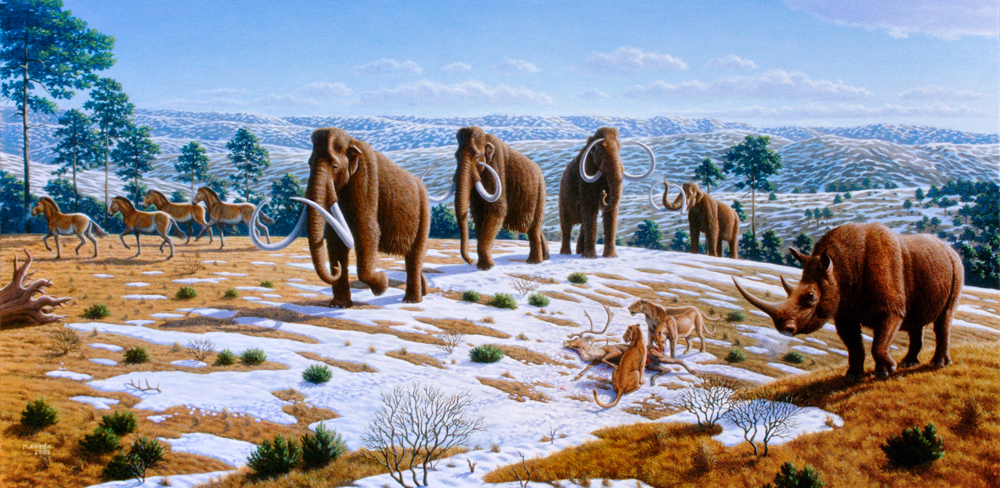

In [76]:
from heat import heat, heat_plot
import numpy as np
from numpy import pi, sqrt
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Part 1: Estimating past cliamte from glacier borehole temperatures

## A. Annual temperature fluctuations in a 150m thick glacier.
This simulation assumes that the earth warms the glacier from below, and that a sine-wave pattern of temperature fluctuations occurs as the surface. What would a borehole temperature measurement yield?

In [197]:
start_year = 2003
end_year = 2023
number_of_time_steps = (end_year-start_year)*16 - 1
max_depth = 150

# Make a vector of times (units are in decimal years)
t = np.linspace(start_year,end_year, number_of_time_steps+1)

# Force the temperature at the surface to follow a sinusoidal pattern corresponding to an annual fluctuation, 
# plus a mean annual background temperature
mean_annual_T = -10
t_surf= mean_annual_T* np.ones(number_of_time_steps+1) - np.cos(np.pi*2*t)

#### Use the function plt.plot() to plot the surface temperature

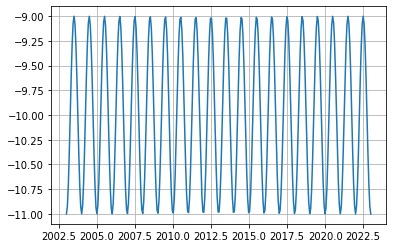

In [198]:
plt.plot(t,t_surf)
plt.grid()

### Run the heat flow calculation

In [199]:
U,t,z = heat(t_surf,tmax=end_year,tmin=start_year,nt=number_of_time_steps,zmax=max_depth)

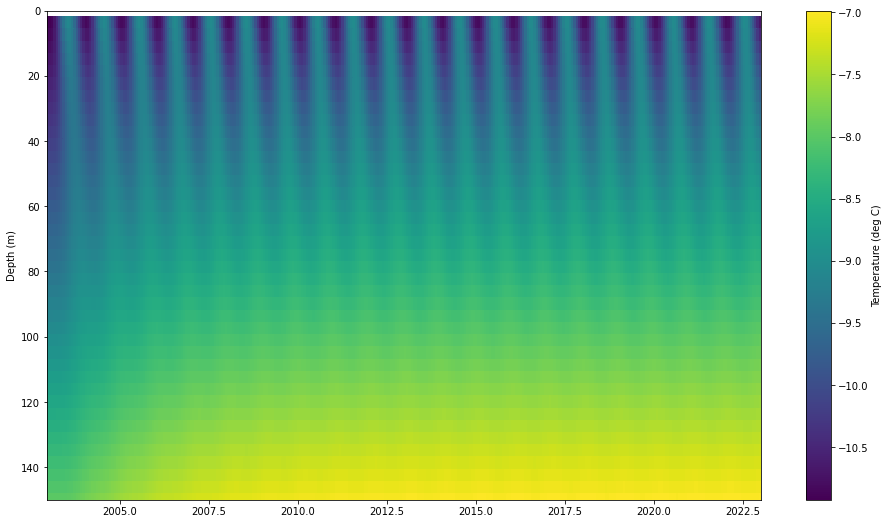

In [200]:
plt.subplots(figsize=(16,9))
cb=plt.pcolor(t,z,U)
plt.colorbar(cb,label='Temperature (deg C)')
plt.ylabel('Depth (m)')
plt.ylim([max_depth,0])
plt.show()

Let's look at one year of temperature fluctuations:

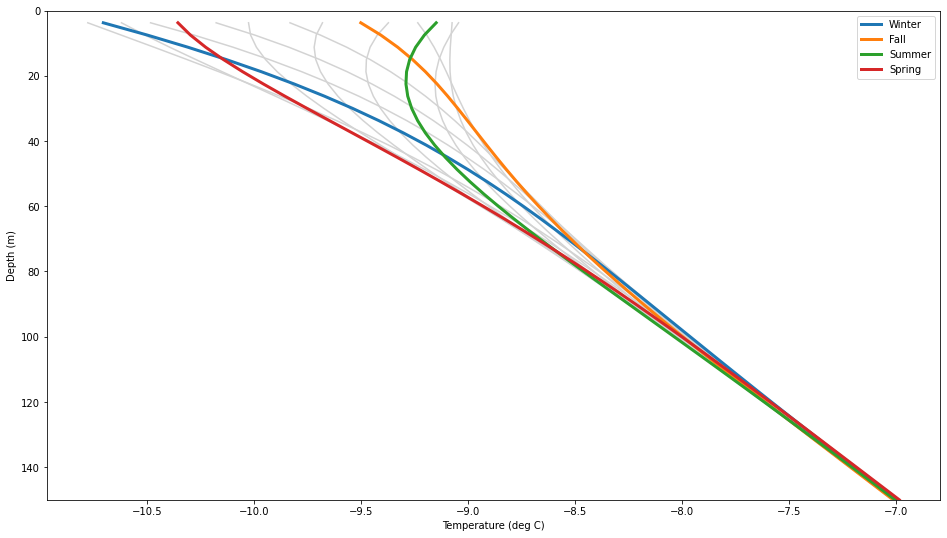

In [219]:
plt.subplots(figsize=(16,9))
for i in range(1,16):
    plt.plot(U[:,-i],z,c='lightgrey')
plt.plot(U[:,-1],z,label=f'Winter',linewidth=3)
plt.plot(U[:,-5],z,label=f'Fall',linewidth=3)
plt.plot(U[:,-9],z,label=f'Summer',linewidth=3)
plt.plot(U[:,-13],z,label=f'Spring',linewidth=3)
plt.legend()
plt.ylabel('Depth (m)')
plt.ylim([max_depth,0])
plt.xlabel('Temperature (deg C)')
plt.show()

The pattern makes more sense if we look at the deviation from a straight line. Plotting the temperatures this way shows that there is a **lag time** associated with thermal diffusion from the surface to depth.

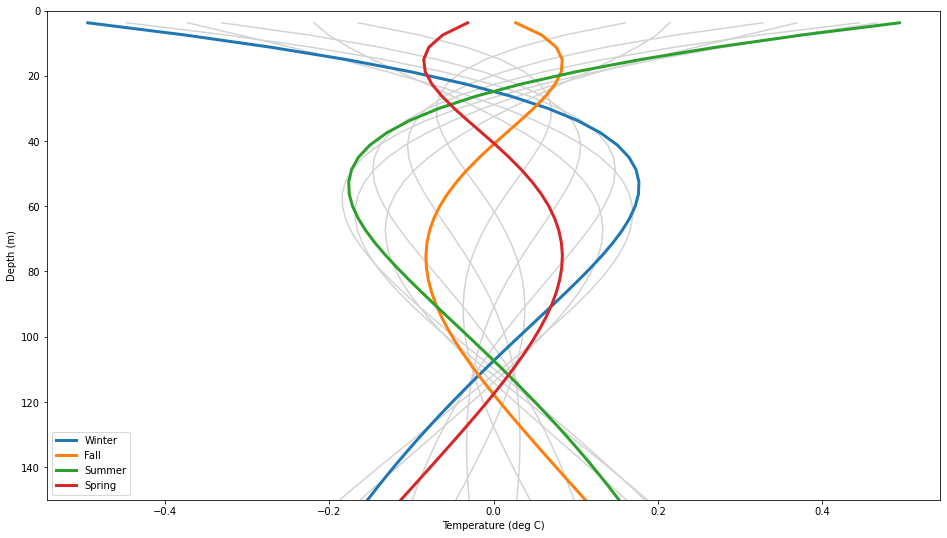

In [220]:
from scipy.signal import detrend
plt.subplots(figsize=(16,9))
for i in range(1,16):
    plt.plot(detrend(U[:,-i]),z,c='lightgrey')
plt.plot(detrend(U[:,-1]),z,label=f'Winter',linewidth=3)
plt.plot(detrend(U[:,-5]),z,label=f'Fall',linewidth=3)
plt.plot(detrend(U[:,-9]),z,label=f'Summer',linewidth=3)
plt.plot(detrend(U[:,-13]),z,label=f'Spring',linewidth=3)
plt.legend()
plt.ylabel('Depth (m)')
plt.ylim([max_depth,0])
plt.xlabel('Temperature (deg C)')
plt.show()

#### How big is the (steady state) temperature fluctuation at the glacier bed?

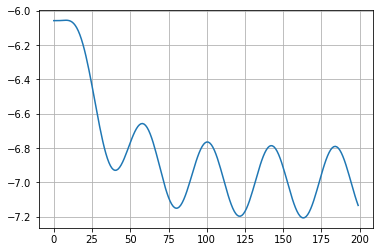

In [6]:
plt.plot(U[-1,:])
plt.grid()

In [7]:
# maximum temperature at the bed
max(U[-1,150:199])

-6.789804934720168

In [8]:
# hint: you'll need to find the minimum temperature at the bed


-7.206629729674525

In [221]:
# hint: Do the same for the surface

## B. Pleistocene temperatures

### Run a simulation for 100,000 years.  

Let's compare to data from Greenland.


This simulation includes the effect of vertical ice compression, which tends to flatten out the temperature profile in the upper part of the ice column.

Data citation:

*Sigfus J. Johnsen, Dorthe Dahl-Jensen, Willi Dansgaard and Niels Gundestrup. 1995. Greenland palaeotemperatures derived from GRIP bore hole temperature and ice core isotope profiles. Tellus, 47(5), 624-629. doi: 10.1034/j.1600-0889.47.issue5.9.x* https://www.ncei.noaa.gov/access/paleo-search/study/17858?siteId=19973

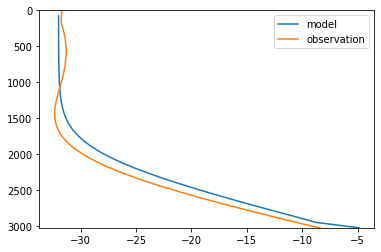

In [90]:
start_year = -100000
end_year = 2023
number_of_time_steps = 199
max_depth = 3027

# Make a vector of times (units are in decimal years)
t = np.linspace(start_year,end_year, number_of_time_steps+1)

# Constant temperature forcing at -32 deg C, approximately equal to modern conditions
t_surf = -32*np.ones_like(t)

U_constant,t,z = heat(t_surf,
             tmax=end_year,
             tmin=start_year,
             nt=number_of_time_steps,
             zmax=max_depth,
             accumulation=1,
             dTdz=0.025)

plt.plot(U_constant[:,-1],z,label='model')
grip = np.genfromtxt('grip.csv', delimiter=',')
plt.plot(grip[:,1],grip[:,0],label='observation')
plt.legend()
plt.ylim([max_depth,0])
plt.show()

Forcing the model assuming no temperature change through time does an okay job fitting the overall profile.  But there are two big deviations that are worth exploring.  These deviations are caused by actual paleotemperature fluctuations. Let's zoom in on the upper 1km:

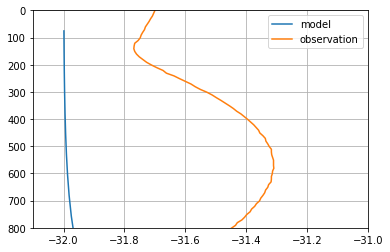

In [116]:
plt.plot(U_constant[:,-1],z,label='model')
grip = np.genfromtxt('grip.csv', delimiter=',')
plt.plot(grip[:,1],grip[:,0],label='observation')
plt.legend()
plt.ylim([800,0])
plt.xlim([-32.1,-31])
plt.grid()

We see that there is a *warm* anomaly at a depth of $z=550$ m.  We will now calculate what time in the past that is represented by this depth of diffusion.  Using the equation $$T = \frac{(Z/2)^2}{ \pi \alpha},$$ where $\alpha=35$ m$^2$/year is the thermal diffusivity of ice. How long ago was this warm period?  This answer is not going to be very accurate since we have neglected a few important processes (discussed in lecture).  So we should round our answer to the nearest hundred years.

This event in Earth's history is called the **Medieval Warm Period**.  The average surface temperature difference between present day and the HCO had to be at least equal to the difference in the ice core temperature from the present day surface temperature.  What is this lower bound, to the nearest tenth of a degree Celcius?

# Part 2: Celestial forcing of the Pleistocene Ice Ages

In this first activity, we will examine the relationship between celestial forcing and the Pleistocene ice ages.  Our main question for this activity is: **what is the dominant control on the ice age cycles?**

In [233]:
from modqa4 import global_temperature_model, easy_fft
from matplotlib.pyplot import plot, xlabel, ylabel, show, subplots, grid,twinx,xscale,yscale
from numpy import linspace, pi, sin, max
import pandas as pd

#First, we'll load datasets that contain orbital parameters and oxygen isotope data:
orbital_history = pd.read_fwf('orbit91',)
oxygen_isotopes = pd.read_csv('LR04_constsed_Lisiecki2010.txt',delimiter='\t',comment='%',header=0)

Here, we plot a dataset that shows how a **temperature proxy**, specifically, the marine Oxygen isotope record, varies over the last 1 million years.  

Dataset citation:
*Lisiecki, L. E., and M. E. Raymo (2005), A Pliocene-Pleistocene stack of 57 globally distributed benthic d18O records, Paleoceanography, 20, PA1003, doi:10.1029/2004PA001071.*

This specific dataset uses a global record of marine (oceanic) benthic (ocean floor sediment) foraminifera (tiny shelled creatures) as a record for Oxygen isotopes. Foraminifera, or "forams" look like this:

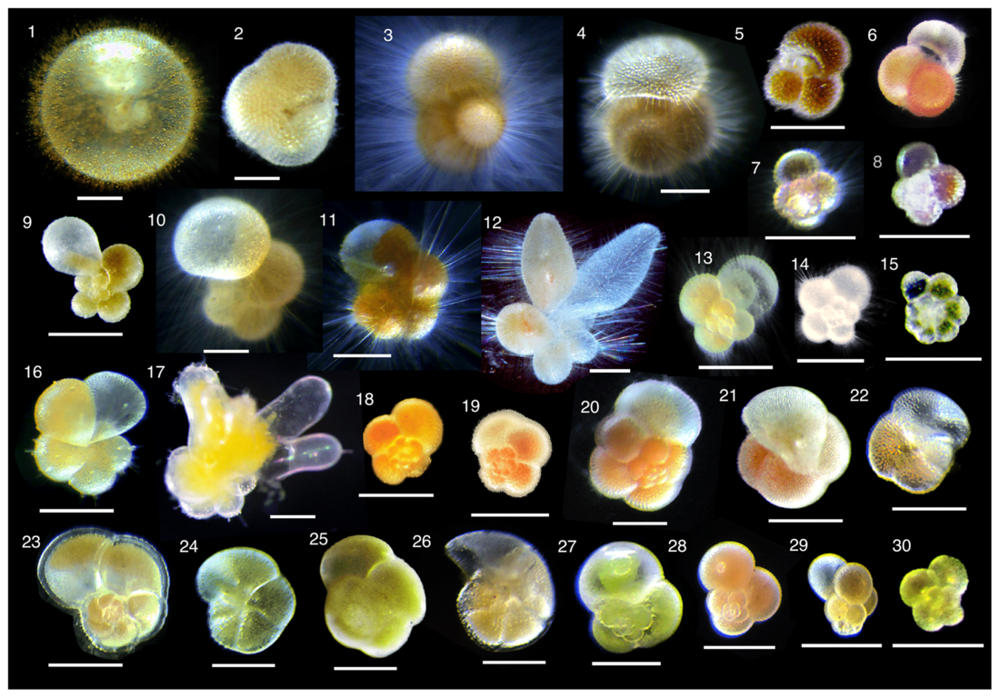!
Scale is 200 microns.

Here is what the the foram temperature proxy record looks like:

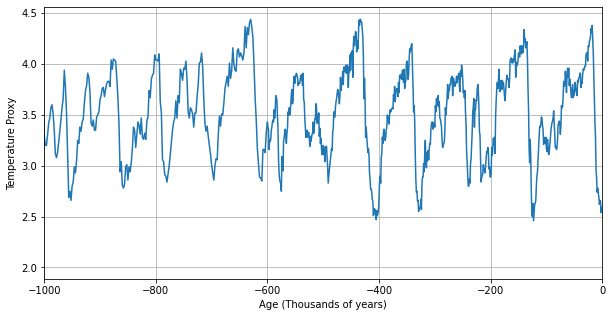

In [232]:
fig,ax = subplots(figsize=(10,5))
plt.plot(-oxygen_isotopes.age,oxygen_isotopes.d18O)
xlabel('Age (Thousands of years)')
ylabel('Temperature Proxy')
ax.set_xlim([-1000,0])
grid()
show()

## This record shows that about a dozen ice ages have occurred in the last million years
*What is the timing of these ice ages?  Why do they occur at nearly evenly spaced periods in time?* In order to answer this question, we will use the Fourier Transform.

**At this point, please watch the first ten minutes of this tutorial about the Fourier Transform** https://www.youtube.com/watch?v=spUNpyF58BY&ab_channel=3Blue1Brown

In [267]:
# Calculate the Fourier Transform
ft,period = easy_fft(oxygen_isotopes.d18O)

/home/iced/notebooks/ess107-2023-assignment-4/modqa4.py:42: RuntimeWarning: divide by zero encountered in true_divide
  period = 1/f


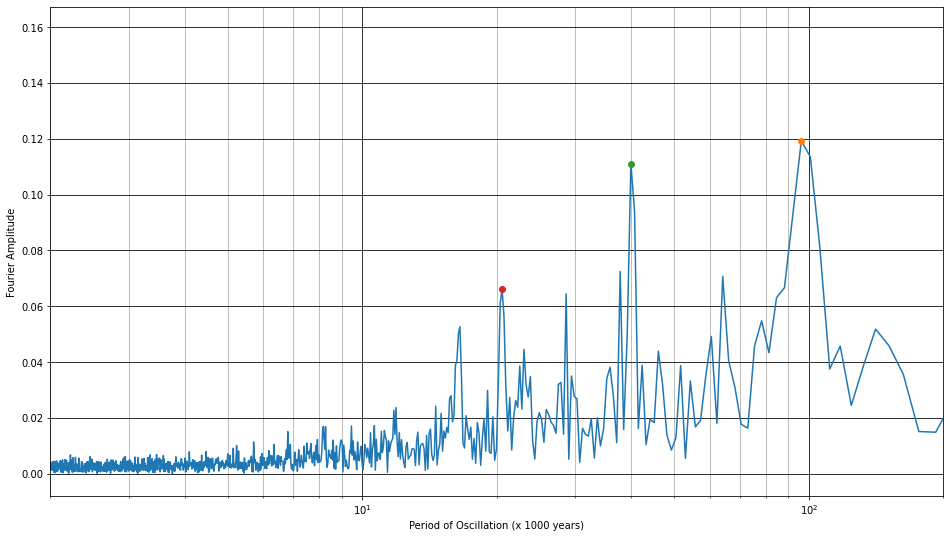

In [281]:
# Plot the transform
plt.subplots(figsize=(16,9))
plt.plot(period,ft)
plt.plot(period[22],ft[22],'o')
plt.plot(period[53],ft[53],'o')
plt.plot(period[103],ft[103],'o')
plt.xscale('log')
# plt.yscale('log')
plt.xlabel('Period of Oscillation (x 1000 years)')
plt.ylabel('Fourier Amplitude')
plt.xlim([2,200])
plt.grid()
plt.grid(visible=True, which='minor')
plt.grid(visible=True, which='major',c='k')
plt.show()

**Which periods contain the most energy in this record?**  Three prominent peaks are noted with colorful dots, please record these in the Assignment.